In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import joblib
import pandas as pd
import numpy as np
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model

In [3]:
# Load the cleaned dataset
df_cleaned = pd.read_csv('../data/processed/data_cleaned.csv')

X = df_cleaned.drop(columns=['diagnosis'])
y = df_cleaned['diagnosis']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [4]:
# Load saved models
model_dir = '../models'
models = {
    'logistic_regression': joblib.load(os.path.join(model_dir, 'logistic_regression.pkl')),
    'svm': joblib.load(os.path.join(model_dir, 'svm.pkl')),
    'gaussian_process': joblib.load(os.path.join(model_dir, 'gaussian_process.pkl')),
    'adaboost': joblib.load(os.path.join(model_dir, 'adaboost.pkl')),
    'catboost': joblib.load(os.path.join(model_dir, 'catboost.pkl')),
    'random_forest': joblib.load(os.path.join(model_dir, 'random_forest.pkl')),
    'gradient_boosting': joblib.load(os.path.join(model_dir, 'gradient_boosting.pkl')),
    'xgboost': joblib.load(os.path.join(model_dir, 'xgboost.pkl')),
    'lightgbm': joblib.load(os.path.join(model_dir, 'lightgbm.pkl')),
    'extra_trees': joblib.load(os.path.join(model_dir, 'extra_trees.pkl')),
    'k_nn': joblib.load(os.path.join(model_dir, 'k-nn.pkl')),
    'naive_bayes': joblib.load(os.path.join(model_dir, 'naive_bayes.pkl')),
    'mlp_classifier': joblib.load(os.path.join(model_dir, 'mlp_classifier.pkl')),
    'ann': load_model(os.path.join(model_dir, 'ann_model.h5'))
}

print("Models loaded.")

Models loaded.


In [5]:
# SHAP Analysis for Tree-Based Models
def shap_analysis_tree_model(model, X_test):

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test)
    
    shap.summary_plot(shap_values, X_test, plot_type="bar")
    shap.summary_plot(shap_values, X_test)

# SHAP Analysis for ANN
def shap_analysis_ann(model, X_test):
    if isinstance(X_test, pd.DataFrame):
        X_test = X_test.values

    explainer = shap.KernelExplainer(model.predict, X_test[:16])
    shap_values = explainer.shap_values(X_test)

    shap.summary_plot(shap_values, X_test)

In [6]:
# LIME Analysis
def lime_analysis(model, X_train, X_test, model_name):

    explainer = LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=X_train.columns,
        class_names=['Benign', 'Malignant'],
        mode='classification'
    )
    
    if hasattr(model, "predict_proba"):
        predict_fn = model.predict_proba
    elif hasattr(model, "decision_function"):
        def predict_fn(x):
            decision_scores = model.decision_function(x)
            return np.vstack([1 - decision_scores, decision_scores]).T
    else:
        raise AttributeError(f"Model {model_name} does not support LIME interpretation.")

    exp = explainer.explain_instance(
        data_row=X_test.iloc[0],
        predict_fn=predict_fn
    )
    
    exp.show_in_notebook()
    exp.as_pyplot_figure()

Explaining model: logistic_regression


Explaining model: svm


Explaining model: gaussian_process


Explaining model: adaboost


Explaining model: catboost


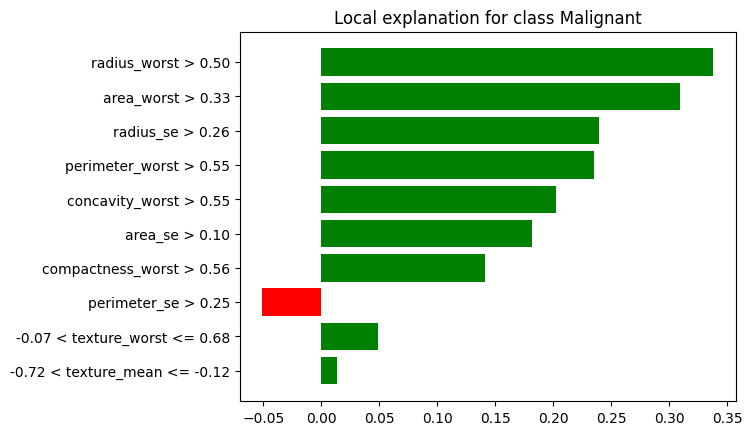

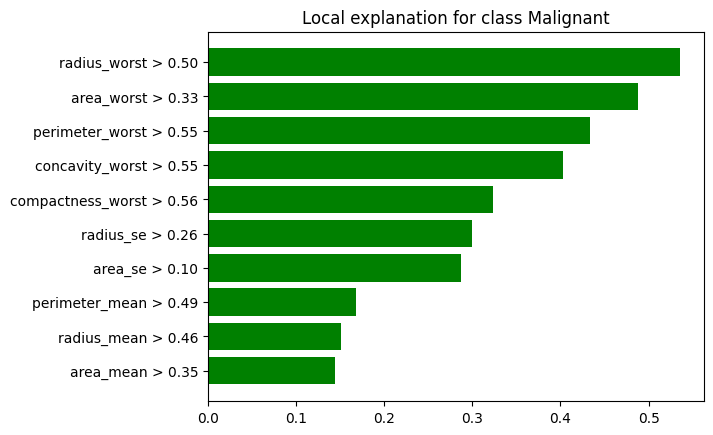

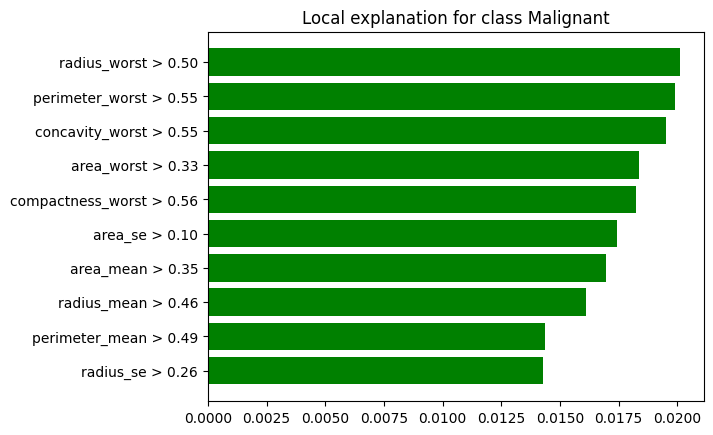

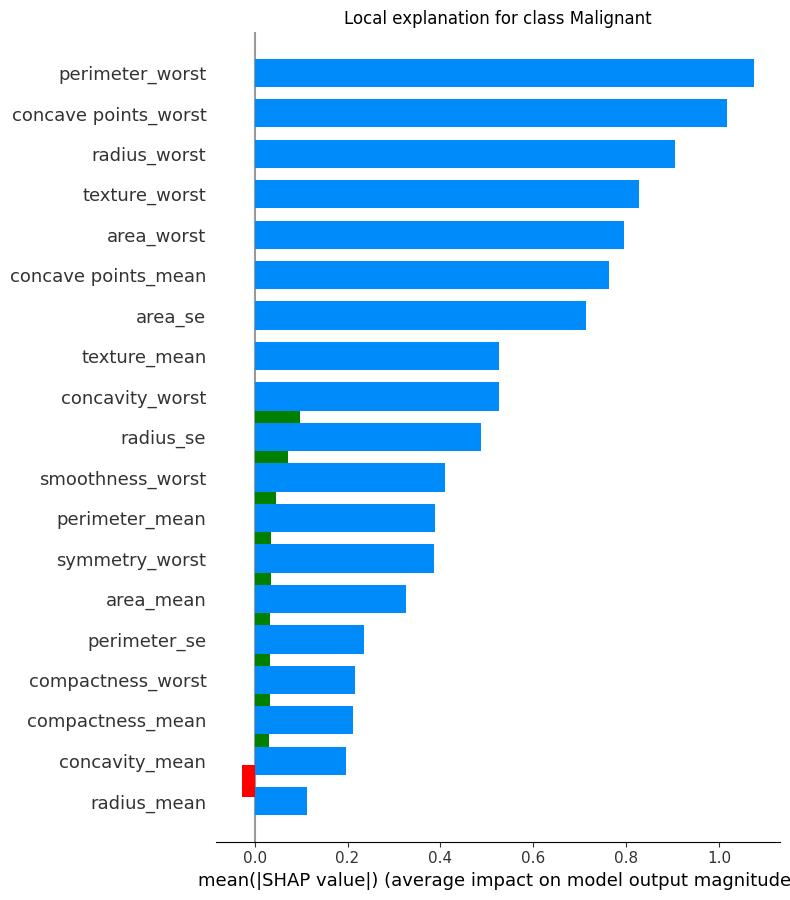

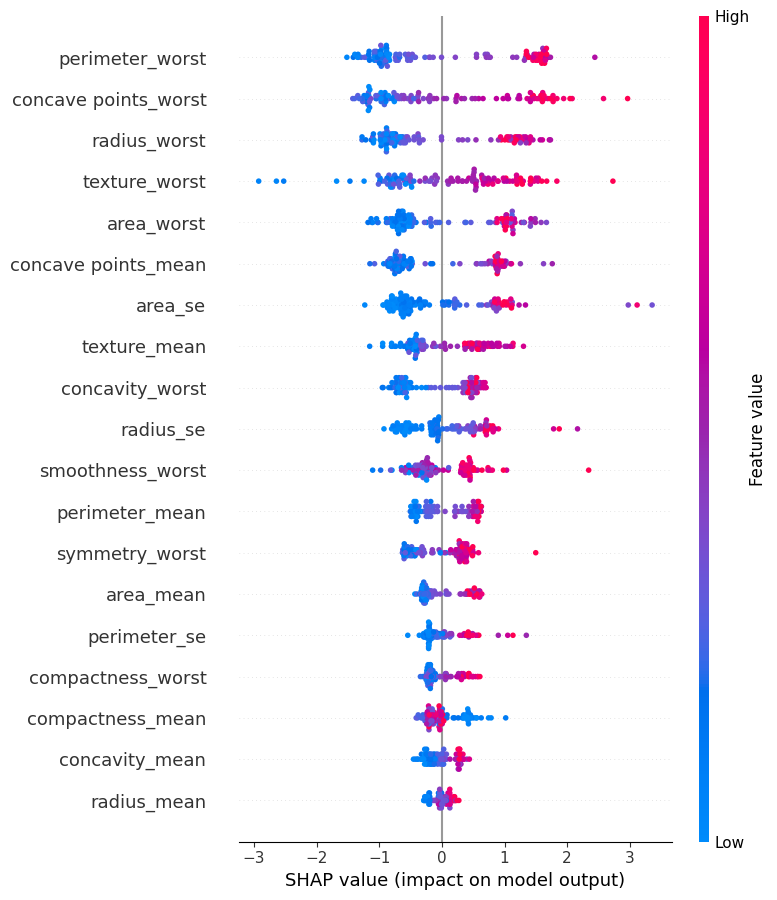

Explaining model: random_forest


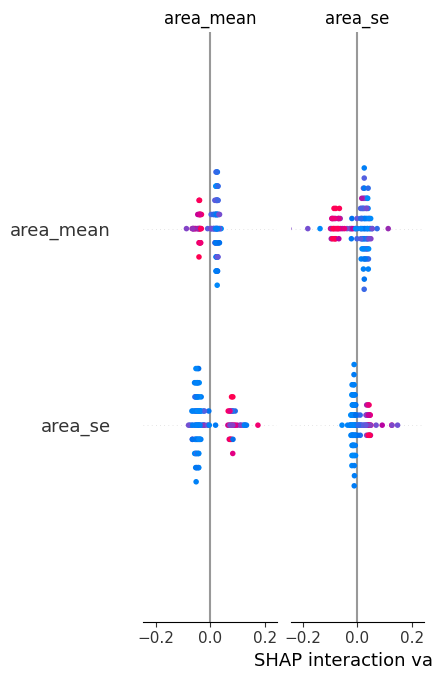

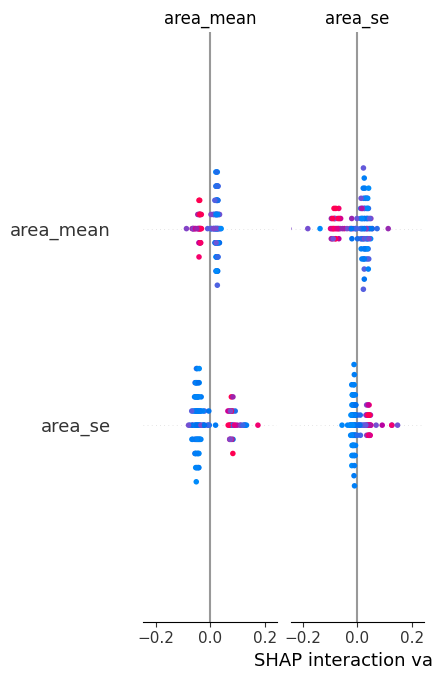

Explaining model: gradient_boosting


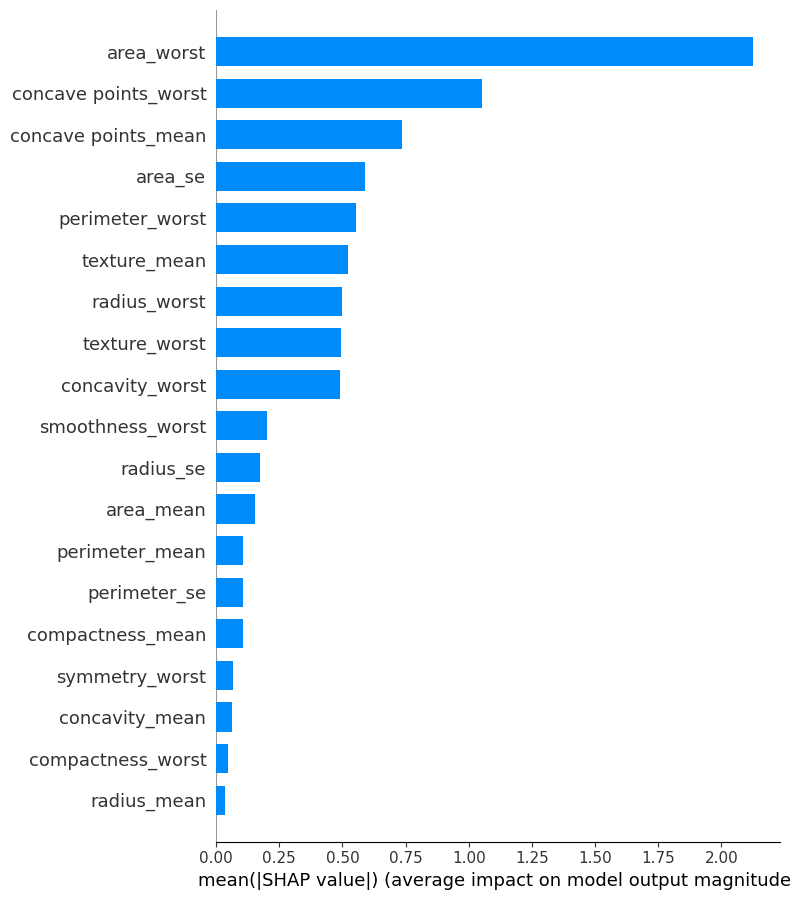

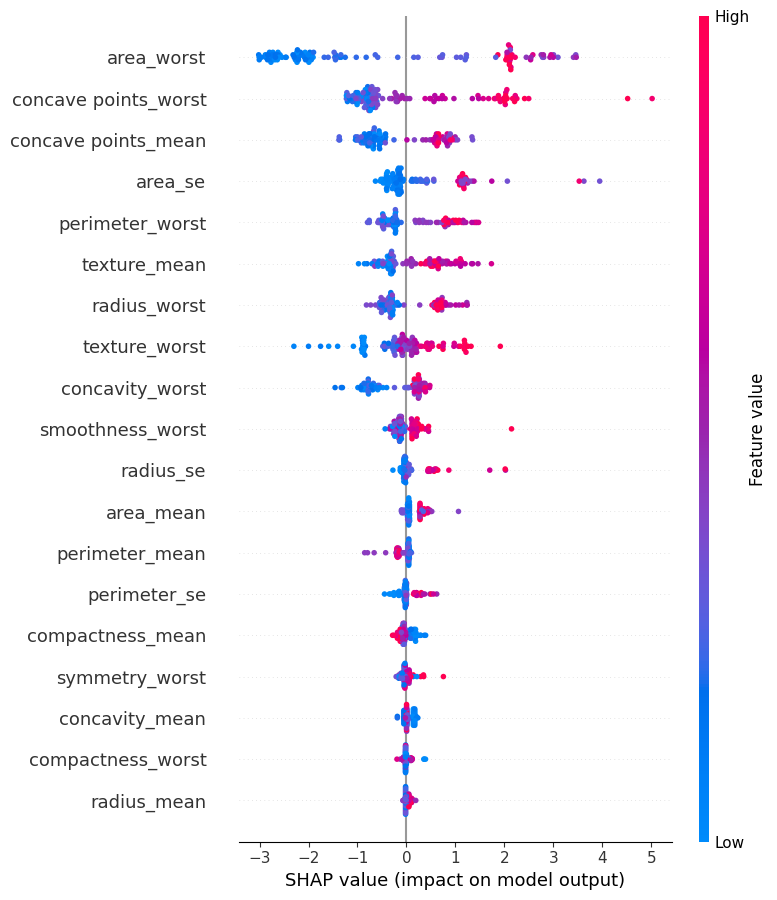

Explaining model: xgboost


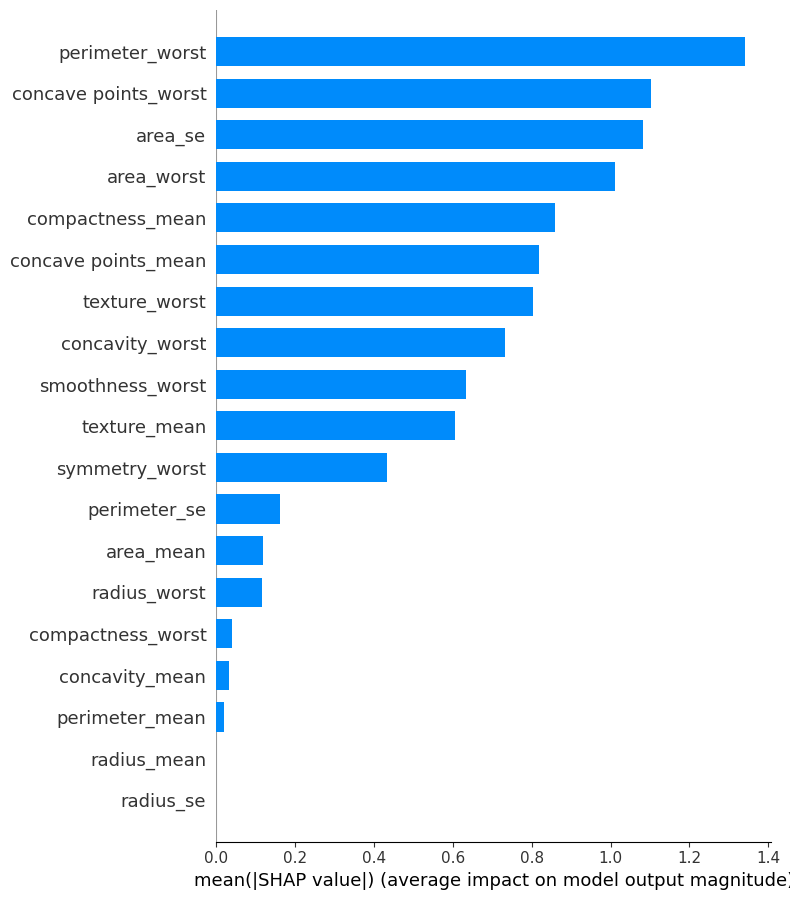

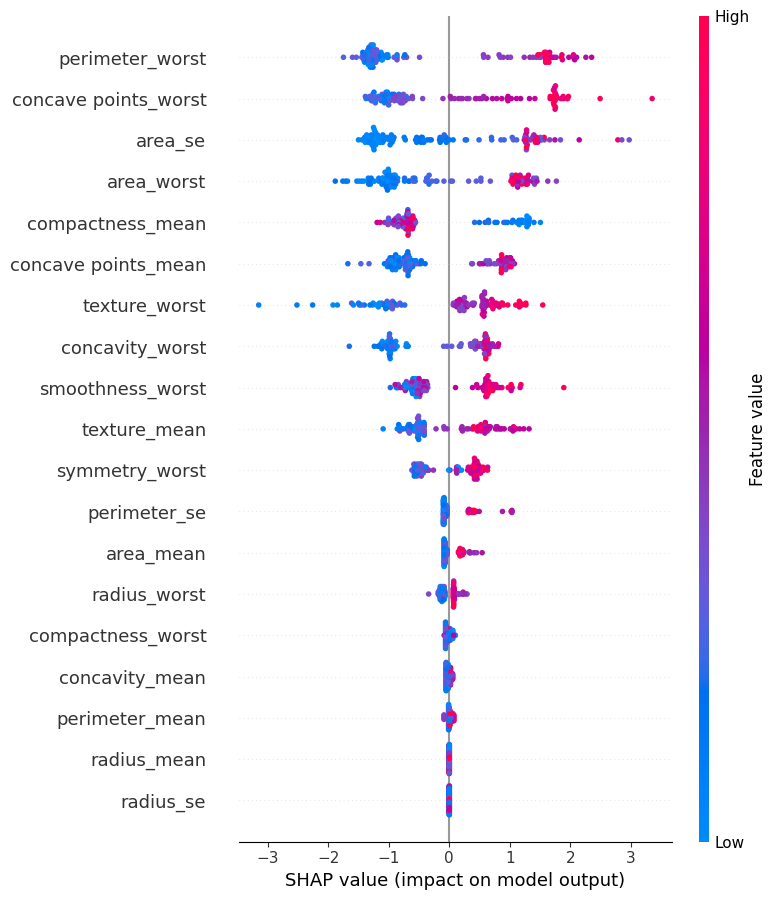

Explaining model: lightgbm


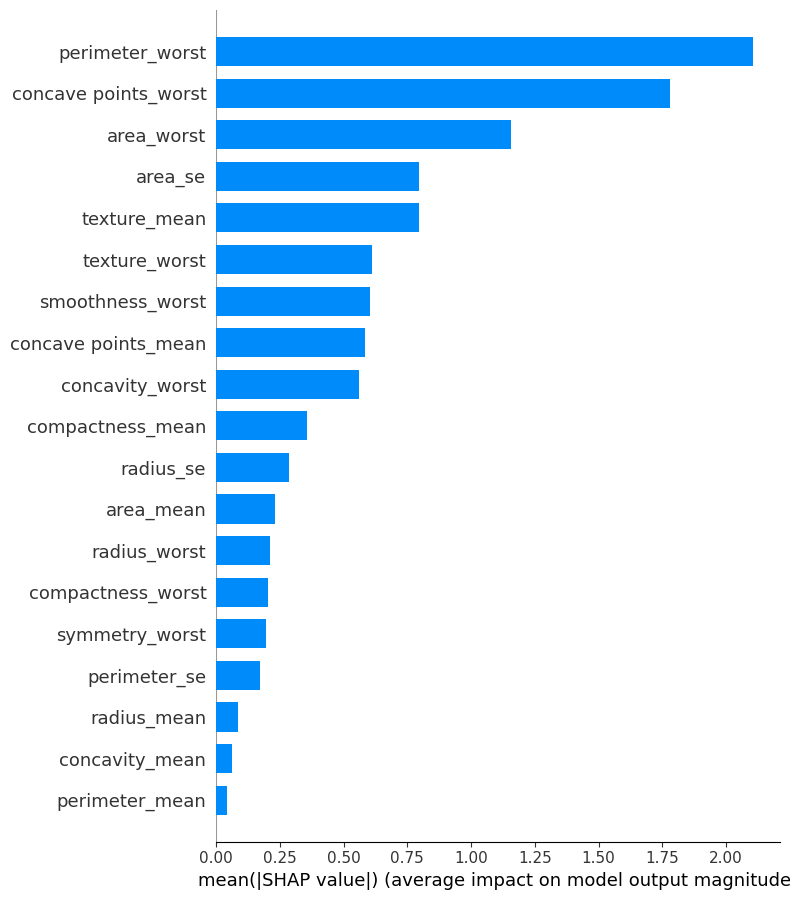

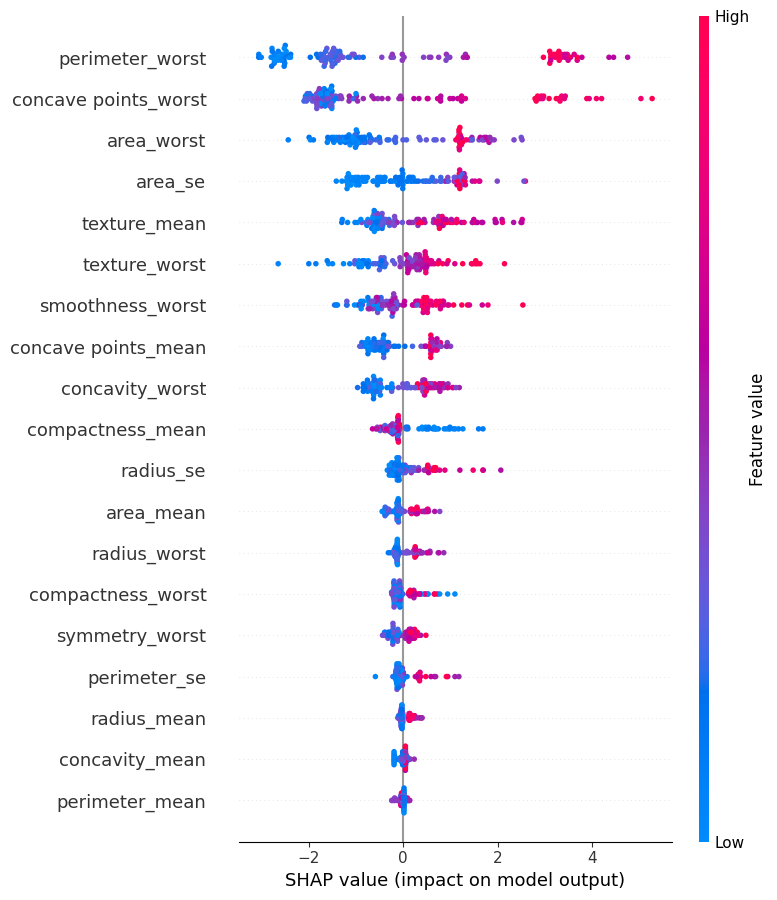

Explaining model: extra_trees


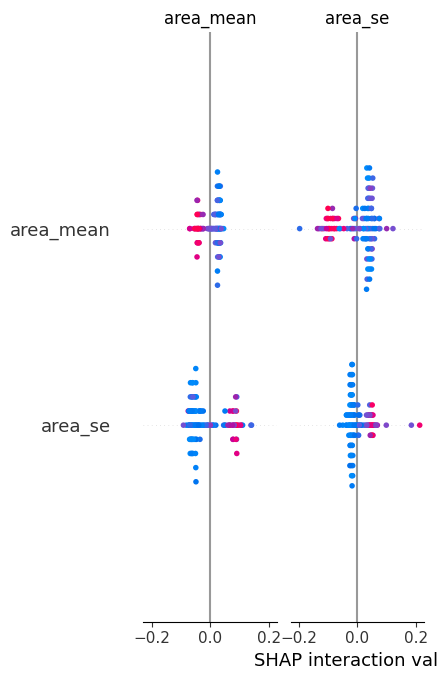

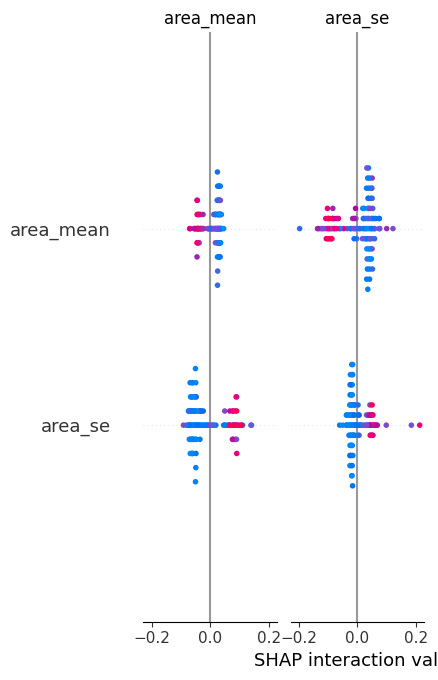

Explaining model: k_nn


Explaining model: naive_bayes


Explaining model: mlp_classifier


Explaining model: ann
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  0%|                                                                                                                                                                                                      | 0/114 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step


  1%|█▋                                                                                                                                                                                            | 1/114 [00:01<03:18,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step


  2%|███▎                                                                                                                                                                                          | 2/114 [00:03<03:04,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step


  3%|█████                                                                                                                                                                                         | 3/114 [00:05<03:05,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step


  4%|██████▋                                                                                                                                                                                       | 4/114 [00:06<03:04,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step  


  4%|████████▎                                                                                                                                                                                     | 5/114 [00:09<03:37,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step


  5%|██████████                                                                                                                                                                                    | 6/114 [00:10<03:21,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


  6%|███████████▋                                                                                                                                                                                  | 7/114 [00:13<03:44,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step


  7%|█████████████▎                                                                                                                                                                                | 8/114 [00:15<03:28,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


  8%|███████████████                                                                                                                                                                               | 9/114 [00:16<03:20,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step 


  9%|████████████████▌                                                                                                                                                                            | 10/114 [00:18<03:13,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 10%|██████████████████▏                                                                                                                                                                          | 11/114 [00:20<03:17,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step


 11%|███████████████████▉                                                                                                                                                                         | 12/114 [00:22<03:09,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 11%|█████████████████████▌                                                                                                                                                                       | 13/114 [00:24<03:09,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step


 12%|███████████████████████▏                                                                                                                                                                     | 14/114 [00:26<03:06,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step


 13%|████████████████████████▊                                                                                                                                                                    | 15/114 [00:28<03:04,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step


 14%|██████████████████████████▌                                                                                                                                                                  | 16/114 [00:29<02:57,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step


 15%|████████████████████████████▏                                                                                                                                                                | 17/114 [00:31<02:54,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step


 16%|█████████████████████████████▊                                                                                                                                                               | 18/114 [00:33<02:49,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 17%|███████████████████████████████▌                                                                                                                                                             | 19/114 [00:35<02:57,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step


 18%|█████████████████████████████████▏                                                                                                                                                           | 20/114 [00:37<02:51,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 18%|██████████████████████████████████▊                                                                                                                                                          | 21/114 [00:38<02:50,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step


 19%|████████████████████████████████████▍                                                                                                                                                        | 22/114 [00:40<02:48,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step


 20%|██████████████████████████████████████▏                                                                                                                                                      | 23/114 [00:42<02:48,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step


 21%|███████████████████████████████████████▊                                                                                                                                                     | 24/114 [00:44<02:46,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 22%|█████████████████████████████████████████▍                                                                                                                                                   | 25/114 [00:46<02:46,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 23%|███████████████████████████████████████████                                                                                                                                                  | 26/114 [00:48<02:43,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step


 24%|████████████████████████████████████████████▊                                                                                                                                                | 27/114 [00:50<02:39,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 25%|██████████████████████████████████████████████▍                                                                                                                                              | 28/114 [00:52<02:44,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step


 25%|████████████████████████████████████████████████                                                                                                                                             | 29/114 [00:53<02:38,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 26%|█████████████████████████████████████████████████▋                                                                                                                                           | 30/114 [00:55<02:38,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step  


 27%|███████████████████████████████████████████████████▍                                                                                                                                         | 31/114 [00:58<03:00,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step


 28%|█████████████████████████████████████████████████████                                                                                                                                        | 32/114 [01:00<02:45,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 29%|██████████████████████████████████████████████████████▋                                                                                                                                      | 33/114 [01:02<02:42,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step


 30%|████████████████████████████████████████████████████████▎                                                                                                                                    | 34/114 [01:03<02:32,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step


 31%|██████████████████████████████████████████████████████████                                                                                                                                   | 35/114 [01:05<02:25,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step  


 32%|███████████████████████████████████████████████████████████▋                                                                                                                                 | 36/114 [01:08<02:42,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 32%|█████████████████████████████████████████████████████████████▎                                                                                                                               | 37/114 [01:10<02:35,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 33%|███████████████████████████████████████████████████████████████                                                                                                                              | 38/114 [01:12<02:31,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 34%|████████████████████████████████████████████████████████████████▋                                                                                                                            | 39/114 [01:13<02:27,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 35%|██████████████████████████████████████████████████████████████████▎                                                                                                                          | 40/114 [01:15<02:24,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 36%|███████████████████████████████████████████████████████████████████▉                                                                                                                         | 41/114 [01:17<02:19,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 37%|█████████████████████████████████████████████████████████████████████▋                                                                                                                       | 42/114 [01:19<02:17,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step


 38%|███████████████████████████████████████████████████████████████████████▎                                                                                                                     | 43/114 [01:21<02:08,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 39%|████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 44/114 [01:23<02:07,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 39%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                  | 45/114 [01:24<02:05,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 40%|████████████████████████████████████████████████████████████████████████████▎                                                                                                                | 46/114 [01:26<02:03,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 41%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 47/114 [01:28<02:03,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 42%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 48/114 [01:30<02:01,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 43%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 49/114 [01:32<02:04,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step


 44%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                          | 50/114 [01:34<01:59,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step


 45%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 51/114 [01:35<01:55,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 46%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 52/114 [01:37<01:51,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 46%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 53/114 [01:39<01:51,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 47%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 54/114 [01:41<01:51,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step


 48%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 55/114 [01:43<01:45,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 49%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 56/114 [01:45<01:49,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 50%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 57/114 [01:47<01:52,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 51%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 58/114 [01:50<02:00,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 52%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                           | 59/114 [01:51<01:51,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 60/114 [01:53<01:44,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 61/114 [01:56<01:58,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 62/114 [01:58<01:59,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 63/114 [02:00<01:53,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 64/114 [02:02<01:45,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 65/114 [02:04<01:39,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step


 58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 66/114 [02:06<01:33,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 67/114 [02:08<01:29,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 68/114 [02:10<01:27,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 69/114 [02:12<01:30,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 70/114 [02:15<01:38,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 71/114 [02:17<01:36,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 72/114 [02:19<01:31,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 73/114 [02:21<01:25,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 74/114 [02:23<01:30,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 75/114 [02:27<01:41,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 76/114 [02:30<01:47,  2.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 77/114 [02:33<01:49,  2.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 78/114 [02:36<01:47,  2.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 79/114 [02:41<01:57,  3.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 80/114 [02:44<01:50,  3.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 81/114 [02:48<01:53,  3.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 82/114 [02:51<01:52,  3.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 83/114 [02:55<01:50,  3.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 84/114 [02:58<01:43,  3.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 85/114 [03:02<01:44,  3.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 86/114 [03:05<01:37,  3.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step  


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 87/114 [03:09<01:31,  3.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 88/114 [03:12<01:31,  3.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 89/114 [03:16<01:28,  3.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 90/114 [03:19<01:25,  3.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 91/114 [03:23<01:23,  3.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 92/114 [03:26<01:17,  3.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 93/114 [03:30<01:13,  3.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step  


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 94/114 [03:34<01:15,  3.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 95/114 [03:38<01:09,  3.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 96/114 [03:41<01:06,  3.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 97/114 [03:45<01:01,  3.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 98/114 [03:50<01:03,  3.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 99/114 [03:53<00:57,  3.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 100/114 [03:56<00:51,  3.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 101/114 [04:01<00:51,  3.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 102/114 [04:05<00:46,  3.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 103/114 [04:08<00:41,  3.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 104/114 [04:12<00:36,  3.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 105/114 [04:17<00:36,  4.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 106/114 [04:20<00:31,  3.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 107/114 [04:24<00:27,  3.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 108/114 [04:29<00:24,  4.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 109/114 [04:33<00:19,  3.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 110/114 [04:37<00:16,  4.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 111/114 [04:41<00:11,  3.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 112/114 [04:45<00:08,  4.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 113/114 [04:49<00:04,  4.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1043/1043 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step



00%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 114/114 [04:53<00:00,  2.57s/it]

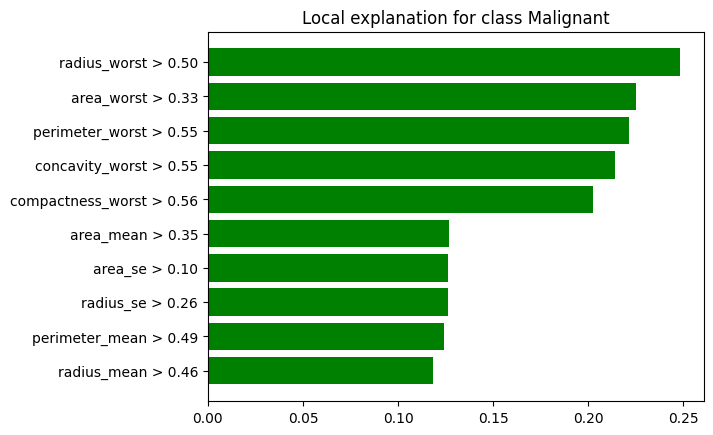

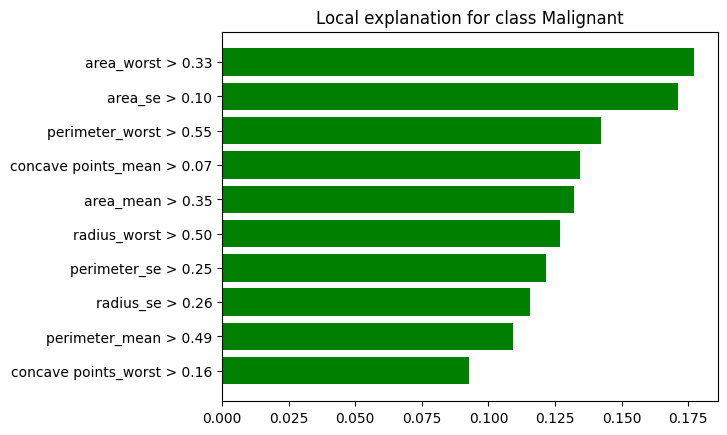

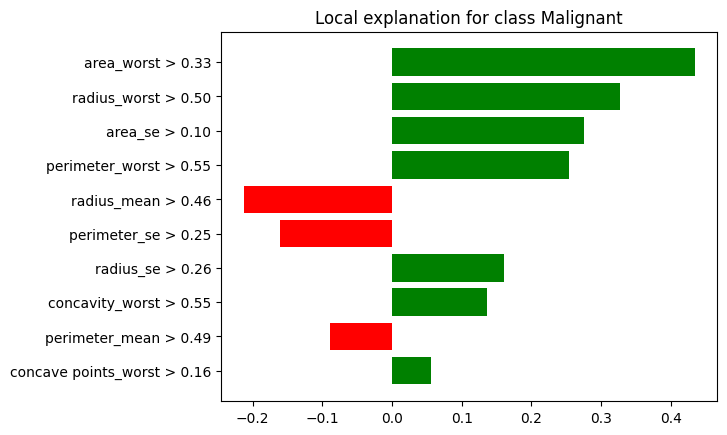

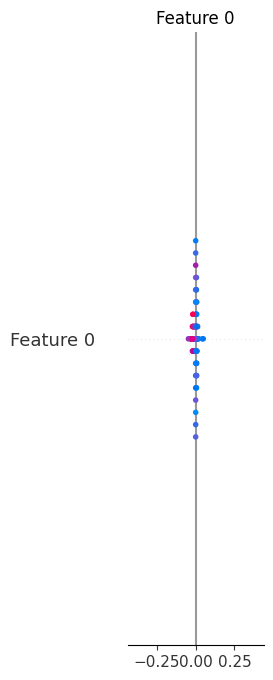

In [7]:
for model_name, model in models.items():
    print(f"Explaining model: {model_name}")

    if model_name in ['random_forest', 'gradient_boosting', 'xgboost', 'lightgbm', 'extra_trees', 'catboost']:
        shap_analysis_tree_model(model, X_test)
    
    elif model_name == 'ann':
        shap_analysis_ann(model, X_test)
    
    else:
        lime_analysis(model, X_train, X_test, model_name)